# <span style="color:#ff5f27;">👨🏻‍🏫 Generative Adversarial Network </span>


## <span style="color:#ff5f27;"> 📝 Imports </span>

In [1]:
!pip install --quiet torch==2.1.1
!pip install --quiet torchvision==0.16.1
!pip install --quiet progressbar2==4.2.0
!pip install --quiet tqdm

In [42]:
from IPython import display
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.animation as animation
from tqdm import tqdm

import torch
from torch import nn
import torch.optim as optim
from torch.autograd import Variable
import torchvision.utils as vutils
from torchvision import transforms, datasets

## <span style="color:#ff5f27;">⚙️ Settings </span>

In [3]:
OUTPUT_DIR = './data/CIFAR-10'
BATCH_SIZE = 128
LR = 0.0002
NUM_EPOCHS = 25
NUM_TEST_SAMPLES = 15


## <span style="color:#ff5f27;">💽 Loading Data </span>

In [4]:
def load_data():
    compose = transforms.Compose(
        [
            transforms.Resize(64),
            transforms.ToTensor(),
            transforms.Normalize((.5, .5, .5), (.5, .5, .5)),
        ])
    return datasets.CIFAR10(root=OUTPUT_DIR, train=True, transform=compose, download=True)

In [5]:
data = load_data()
data_loader = torch.utils.data.DataLoader(data, batch_size=BATCH_SIZE, shuffle=True)
NUM_BATCHES = len(data_loader)

print("No. of Batches = ", NUM_BATCHES)

Files already downloaded and verified
No. of Batches =  391


## <span style="color:#ff5f27;">👨🏻‍🎨 Data Visualization</span>

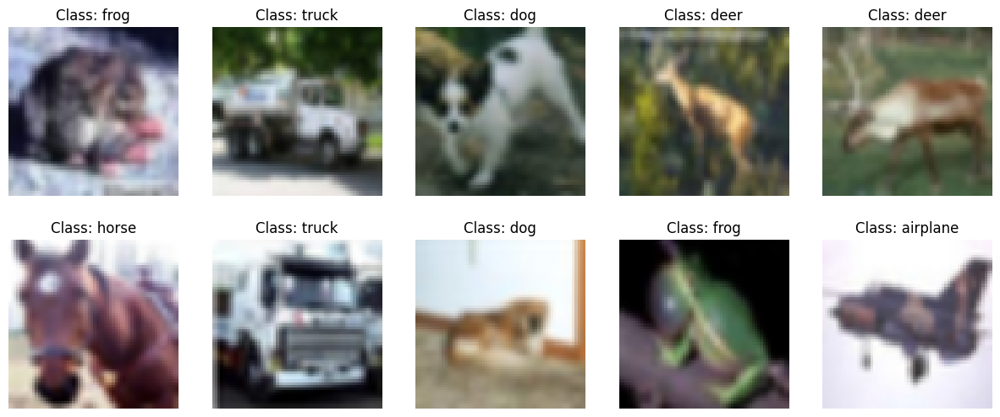

In [6]:
# Function to show images with labels
def imshow(images, labels):
    classification = [
        'airplane', 'automobile', 'bird', 'cat','deer', 
        'dog', 'frog', 'horse', 'ship', 'truck',
    ]
    
    images = images / 2 + 0.5  # Unnormalize
    np_images = images.numpy()
    
    # Determine the number of images and labels
    num_images = len(labels)

    # Create a subplot with a 2x5 grid layout
    fig, axs = plt.subplots(2, 5, figsize=(15, 6))

    # Display each image with its label
    for i in range(2):
        for j in range(5):
            idx = i * 5 + j
            axs[i, j].imshow(np.transpose(np_images[idx], (1, 2, 0)))
            axs[i, j].set_title(f'Class: {classification[labels[idx]]}')
            axs[i, j].axis('off')

    plt.show()

# Get a batch of training images with labels
for images, labels in data_loader:
    # Show a subset of images with labels
    imshow(images[:10], labels[:10])
    break  # Only display one batch for simplicity

# <span style="color:#ff5f27;">👩🏻‍🔬 Building GAN</span>


## <span style="color:#ff5f27;">🕵🏻‍♂️ Discriminator</span>


In [7]:
class Discriminator(torch.nn.Module):
    
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.conv1 = nn.Sequential(nn.Conv2d(in_channels=3, out_channels=128, kernel_size=4, stride=2, padding=1, bias=False), nn.LeakyReLU(0.2, inplace=True))
        self.conv2 = nn.Sequential(nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False), nn.BatchNorm2d(256), nn.LeakyReLU(0.2, inplace=True))
        self.conv3 = nn.Sequential(nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False), nn.BatchNorm2d(512), nn.LeakyReLU(0.2, inplace=True))
        self.conv4 = nn.Sequential(nn.Conv2d(in_channels=512, out_channels=1024, kernel_size=4, stride=2, padding=1, bias=False), nn.BatchNorm2d(1024), nn.LeakyReLU(0.2, inplace=True))
        self.output = nn.Sequential(nn.Linear(1024*4*4, 1), nn.Sigmoid())

    def forward(self, x):
        # Convolutional layers
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        
        # Flatten and apply sigmoid
        x = x.view(-1, 1024*4*4)
        x = self.output(x)
        return x

## <span style="color:#ff5f27;">🔮 Generator</span>


In [8]:
class Generator(torch.nn.Module):
    
    def __init__(self):
        super(Generator, self).__init__()
        
        self.linear = torch.nn.Linear(100, 1024*4*4)
        self.deconv1 = nn.Sequential(nn.ConvTranspose2d(in_channels=1024, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False), nn.BatchNorm2d(512), nn.ReLU(inplace=True))
        self.deconv2 = nn.Sequential(nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False), nn.BatchNorm2d(256), nn.ReLU(inplace=True))
        self.deconv3 = nn.Sequential(nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=4, stride=2, padding=1, bias=False), nn.BatchNorm2d(128), nn.ReLU(inplace=True))
        self.deconv4 = nn.Sequential(nn.ConvTranspose2d(in_channels=128, out_channels=3, kernel_size=4, stride=2, padding=1, bias=False))
        self.output = torch.nn.Tanh()

    def forward(self, x):
        # Project and reshape
        x = self.linear(x)
        x = x.view(x.shape[0], 1024, 4, 4)
        
        # Convolutional layers
        x = self.deconv1(x)
        x = self.deconv2(x)
        x = self.deconv3(x)
        x = self.deconv4(x)
        
        # Apply Tanh
        return self.output(x)

## <span style="color:#ff5f27;">🌫️ Generating Artificial Noise</span>


In [9]:
def noise(size):
    n = Variable(torch.randn(size, 100))
    if torch.backends.mps.is_available(): 
        return n.to(torch.device("mps"))
    return n

In [10]:
def init_weights(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1 or classname.find('BatchNorm') != -1:
        m.weight.data.normal_(0.00, 0.02)

## <span style="color:#ff5f27;">🗽 Initializing Generator and Discriminator</span>


In [11]:
generator = Generator()
discriminator = Discriminator()
generator.apply(init_weights)
discriminator.apply(init_weights)

if torch.backends.mps.is_available():
    mps_device = torch.device("mps")
    generator.to(mps_device)
    discriminator.to(mps_device)

## <span style="color:#ff5f27;">🎯 Optimizers</span>


Defining optimizers for Generator and Discriminator nets.

In [12]:
d_optimizer = optim.Adam(discriminator.parameters(), lr=LR, betas=(0.5, 0.999))
g_optimizer = optim.Adam(generator.parameters(), lr=LR, betas=(0.5, 0.999))

# Loss function
criterion = nn.BCELoss()

## <span style="color:#ff5f27;">⚙️ Functions</span>


In [13]:
def real_data_target(size):
    data = Variable(torch.ones(size, 1))
    if torch.backends.mps.is_available(): 
        return data.to(torch.device("mps"))
    return data

def fake_data_target(size):
    data = Variable(torch.zeros(size, 1))
    if torch.backends.mps.is_available():
        return data.to(torch.device("mps"))
    return data

In [14]:
def train_discriminator(optimizer, real_data, fake_data):
    # Reset gradients
    optimizer.zero_grad()
    
    # 1.1 Train on Real Data
    prediction_real = discriminator(real_data)
    # Calculate error and backpropagate
    error_real = criterion(prediction_real, real_data_target(real_data.size(0)))
    error_real.backward()

    # 1.2 Train on Fake Data
    prediction_fake = discriminator(fake_data)
    # Calculate error and backpropagate
    error_fake = criterion(prediction_fake, fake_data_target(real_data.size(0)))
    error_fake.backward()
    
    # 1.3 Update weights with gradients
    optimizer.step()
    
    # Return error
    return error_real + error_fake, prediction_real, prediction_fake

def train_generator(optimizer, fake_data):
    # 2. Train Generator
    # Reset gradients
    optimizer.zero_grad()
    # Sample noise and generate fake data
    prediction = discriminator(fake_data)
    # Calculate error and backpropagate
    error = criterion(prediction, real_data_target(prediction.size(0)))
    error.backward()
    # Update weights with gradients
    optimizer.step()
    # Return error
    return error

## <span style="color:#ff5f27;">🌫️ Test noise</span>


In [15]:
test_noise = noise(NUM_TEST_SAMPLES)

## <span style="color:#ff5f27;">🔮 Generate Images Function</span>


In [16]:
def generate_images(test_images, num_images, epoch, normalize=True):
    images = test_images

    # Make horizontal grid from image tensor
    horizontal_grid = vutils.make_grid(images, normalize=normalize, scale_each=True)

    # Make vertical grid 
    nrows = int(np.sqrt(num_images))
    grid = vutils.make_grid(images, nrow=nrows, normalize=True, scale_each=True)

    # Plot horizontal
    fig_horizontal = plt.figure(figsize=(16, 16))
    plt.imshow(np.moveaxis(horizontal_grid.numpy(), 0, -1))
    plt.axis('off')

    # Plot squared
    fig_squared = plt.figure()
    plt.imshow(np.moveaxis(grid.numpy(), 0, -1))
    plt.axis('off')

    # Save squared
    plt.savefig(f'images/epoch_{epoch}.png')
    plt.close(fig_squared)

## <span style="color:#ff5f27;"> 🏋🏻‍♂️ Training</span>



Epoch # 0 in progress...


100%|█████████████████████████████████████████| 391/391 [07:47<00:00,  1.20s/it]


Loss (Discriminator): tensor(0.6065, device='mps:0')
Loss (Generator): tensor(2.9947, device='mps:0')

Epoch # 1 in progress...


100%|█████████████████████████████████████████| 391/391 [07:52<00:00,  1.21s/it]


Loss (Discriminator): tensor(0.9419, device='mps:0')
Loss (Generator): tensor(2.1117, device='mps:0')

Epoch # 2 in progress...


100%|█████████████████████████████████████████| 391/391 [07:52<00:00,  1.21s/it]


Loss (Discriminator): tensor(0.9645, device='mps:0')
Loss (Generator): tensor(1.8579, device='mps:0')

Epoch # 3 in progress...


100%|█████████████████████████████████████████| 391/391 [07:53<00:00,  1.21s/it]


Loss (Discriminator): tensor(1.0006, device='mps:0')
Loss (Generator): tensor(1.7679, device='mps:0')

Epoch # 4 in progress...


100%|█████████████████████████████████████████| 391/391 [07:52<00:00,  1.21s/it]


Loss (Discriminator): tensor(0.9340, device='mps:0')
Loss (Generator): tensor(1.9140, device='mps:0')

Epoch # 5 in progress...


100%|█████████████████████████████████████████| 391/391 [07:53<00:00,  1.21s/it]


Loss (Discriminator): tensor(0.8692, device='mps:0')
Loss (Generator): tensor(2.0086, device='mps:0')

Epoch # 6 in progress...


100%|█████████████████████████████████████████| 391/391 [07:53<00:00,  1.21s/it]


Loss (Discriminator): tensor(0.8455, device='mps:0')
Loss (Generator): tensor(2.1163, device='mps:0')

Epoch # 7 in progress...


100%|█████████████████████████████████████████| 391/391 [07:52<00:00,  1.21s/it]


Loss (Discriminator): tensor(0.8638, device='mps:0')
Loss (Generator): tensor(2.1057, device='mps:0')

Epoch # 8 in progress...


100%|█████████████████████████████████████████| 391/391 [07:53<00:00,  1.21s/it]


Loss (Discriminator): tensor(0.8218, device='mps:0')
Loss (Generator): tensor(2.2105, device='mps:0')

Epoch # 9 in progress...


100%|█████████████████████████████████████████| 391/391 [07:52<00:00,  1.21s/it]


Loss (Discriminator): tensor(0.9231, device='mps:0')
Loss (Generator): tensor(1.8805, device='mps:0')

Epoch # 10 in progress...


100%|█████████████████████████████████████████| 391/391 [07:53<00:00,  1.21s/it]


Loss (Discriminator): tensor(0.8635, device='mps:0')
Loss (Generator): tensor(2.0408, device='mps:0')

Epoch # 11 in progress...


100%|█████████████████████████████████████████| 391/391 [07:52<00:00,  1.21s/it]


Loss (Discriminator): tensor(0.7695, device='mps:0')
Loss (Generator): tensor(2.2715, device='mps:0')

Epoch # 12 in progress...


100%|█████████████████████████████████████████| 391/391 [07:53<00:00,  1.21s/it]


Loss (Discriminator): tensor(0.7457, device='mps:0')
Loss (Generator): tensor(2.2651, device='mps:0')

Epoch # 13 in progress...


100%|█████████████████████████████████████████| 391/391 [07:53<00:00,  1.21s/it]


Loss (Discriminator): tensor(0.8219, device='mps:0')
Loss (Generator): tensor(2.1462, device='mps:0')

Epoch # 14 in progress...


100%|█████████████████████████████████████████| 391/391 [07:53<00:00,  1.21s/it]


Loss (Discriminator): tensor(0.8458, device='mps:0')
Loss (Generator): tensor(1.9799, device='mps:0')

Epoch # 15 in progress...


100%|█████████████████████████████████████████| 391/391 [07:53<00:00,  1.21s/it]


Loss (Discriminator): tensor(0.7668, device='mps:0')
Loss (Generator): tensor(2.2339, device='mps:0')

Epoch # 16 in progress...


100%|█████████████████████████████████████████| 391/391 [07:53<00:00,  1.21s/it]


Loss (Discriminator): tensor(0.7053, device='mps:0')
Loss (Generator): tensor(2.4082, device='mps:0')

Epoch # 17 in progress...


100%|█████████████████████████████████████████| 391/391 [07:53<00:00,  1.21s/it]


Loss (Discriminator): tensor(0.6156, device='mps:0')
Loss (Generator): tensor(2.6852, device='mps:0')

Epoch # 18 in progress...


100%|█████████████████████████████████████████| 391/391 [07:53<00:00,  1.21s/it]


Loss (Discriminator): tensor(0.6588, device='mps:0')
Loss (Generator): tensor(2.7468, device='mps:0')

Epoch # 19 in progress...


100%|█████████████████████████████████████████| 391/391 [07:53<00:00,  1.21s/it]


Loss (Discriminator): 

/var/folders/md/5r46qpr17bx1cszjb10rg_d40000gn/T/ipykernel_35910/2807477037.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig_squared = plt.figure()


tensor(0.7015, device='mps:0')
Loss (Generator): tensor(2.3962, device='mps:0')

Epoch # 20 in progress...


100%|█████████████████████████████████████████| 391/391 [07:53<00:00,  1.21s/it]


Loss (Discriminator): 

/var/folders/md/5r46qpr17bx1cszjb10rg_d40000gn/T/ipykernel_35910/2807477037.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig_horizontal = plt.figure(figsize=(16, 16))


tensor(0.7540, device='mps:0')
Loss (Generator): tensor(2.2566, device='mps:0')

Epoch # 21 in progress...


100%|█████████████████████████████████████████| 391/391 [07:47<00:00,  1.20s/it]


Loss (Discriminator): tensor(0.7393, device='mps:0')
Loss (Generator): tensor(2.3652, device='mps:0')

Epoch # 22 in progress...


100%|█████████████████████████████████████████| 391/391 [07:48<00:00,  1.20s/it]


Loss (Discriminator): tensor(0.6226, device='mps:0')
Loss (Generator): tensor(2.4685, device='mps:0')

Epoch # 23 in progress...


100%|█████████████████████████████████████████| 391/391 [07:53<00:00,  1.21s/it]


Loss (Discriminator): tensor(0.5863, device='mps:0')
Loss (Generator): tensor(2.9199, device='mps:0')

Epoch # 24 in progress...


100%|█████████████████████████████████████████| 391/391 [07:53<00:00,  1.21s/it]


Loss (Discriminator): tensor(0.6100, device='mps:0')
Loss (Generator): tensor(2.6986, device='mps:0')


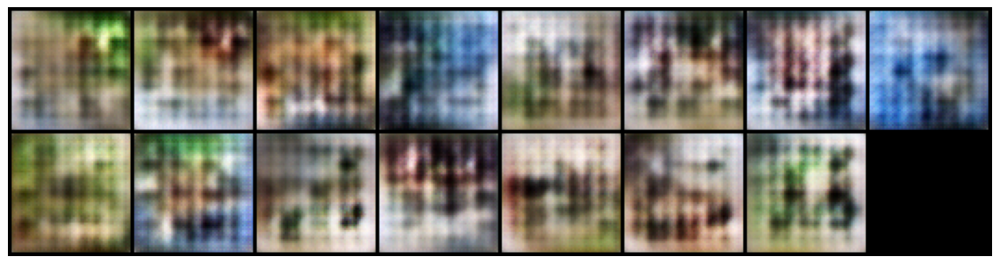

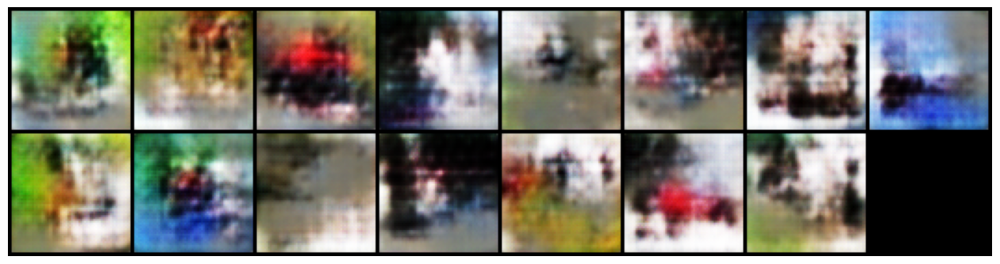

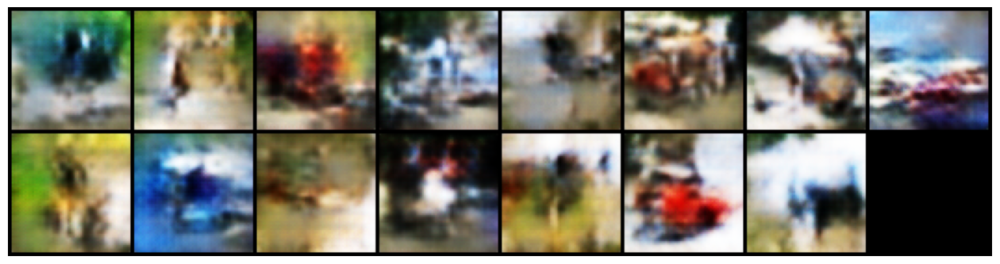

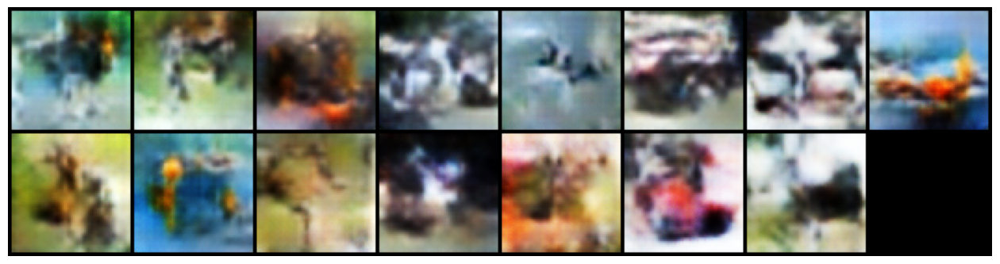

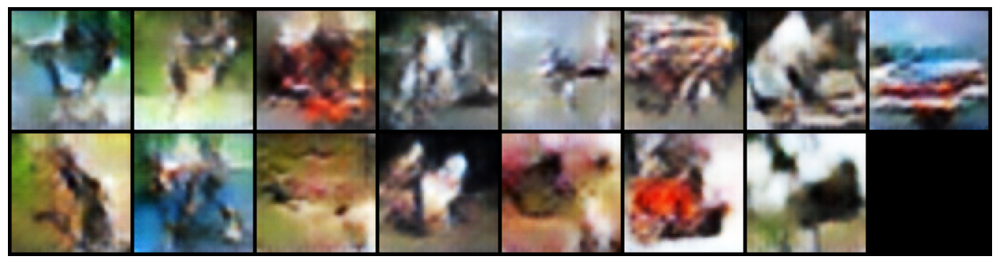

...

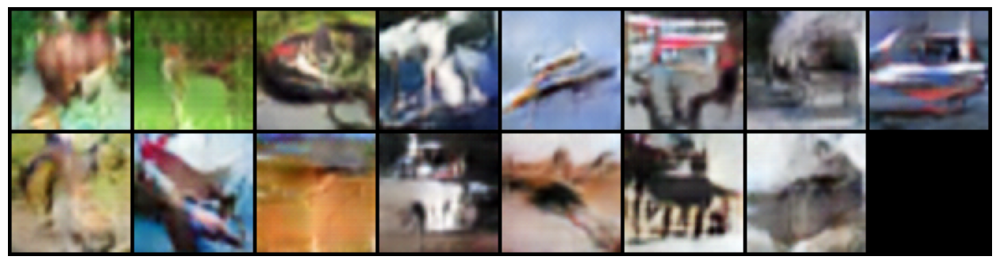

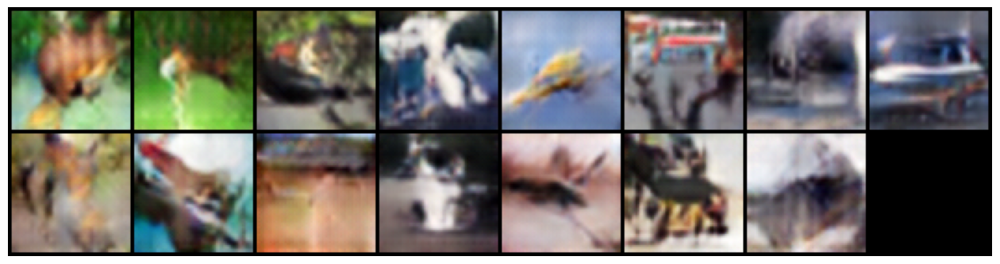

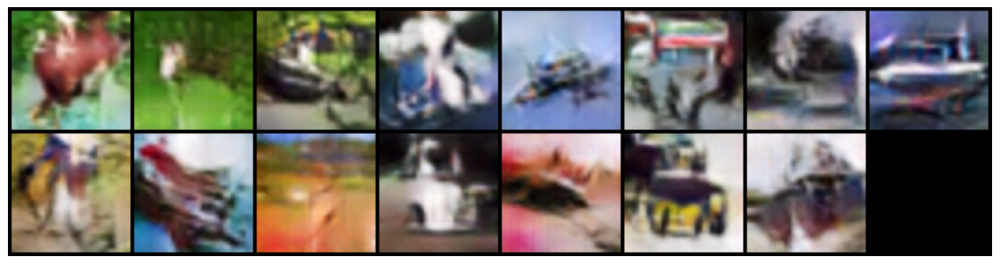

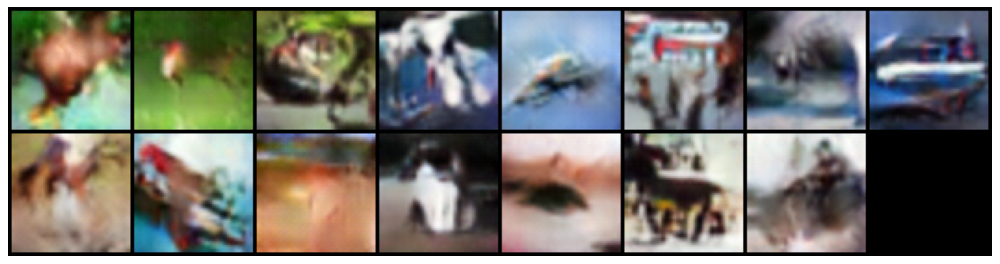

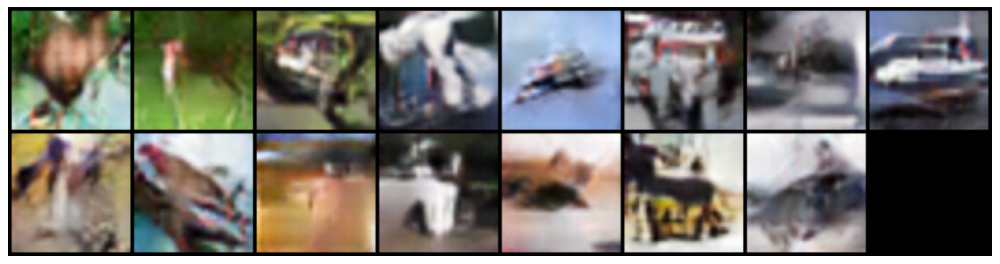

In [17]:
for epoch in range(NUM_EPOCHS):
    print("\nEpoch #", epoch, "in progress...")
    d_running_loss = 0
    g_running_loss = 0
    
    # Wrap the DataLoader with tqdm to visualize progress
    for n_batch, (real_batch, _) in tqdm(enumerate(data_loader), total=len(data_loader)):    
        # 1. Train Discriminator
        real_data = Variable(real_batch)
        if torch.backends.mps.is_available(): 
            real_data = real_data.to(torch.device("mps"))
        fake_data = generator(noise(real_data.size(0))).detach()
        d_error, d_pred_real, d_pred_fake = train_discriminator(d_optimizer, real_data, fake_data)

        # 2. Train Generator
        fake_data = generator(noise(real_batch.size(0)))
        g_error = train_generator(g_optimizer, fake_data)

        d_running_loss += d_error.data
        g_running_loss += g_error.data
  
    print("Loss (Discriminator):", d_running_loss / len(data_loader))
    print("Loss (Generator):", g_running_loss / len(data_loader))

    test_images = generator(test_noise).data.cpu()
    generate_images(test_images, NUM_TEST_SAMPLES, epoch)

## <span style="color:#ff5f27;">👨🏻‍⚖️ Generating Test Images</span>


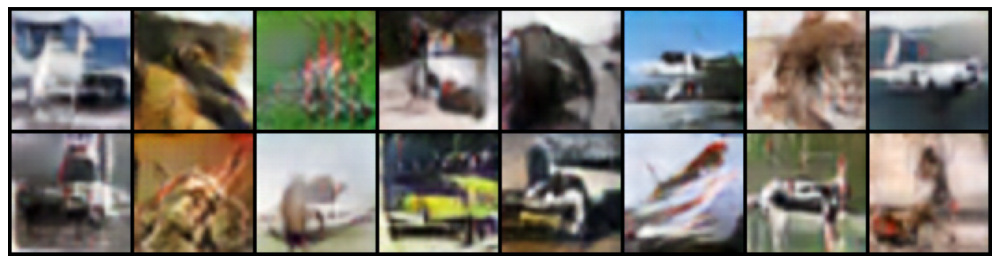

In [18]:
num_samples = 16
test_noise = noise(num_samples)
test_images = generator(test_noise).data.cpu()
generate_images(test_images, NUM_TEST_SAMPLES, 'final')

## <span style="color:#ff5f27;">🎥 Gif Creation</span>


MovieWriter ffmpeg unavailable; using Pillow instead.


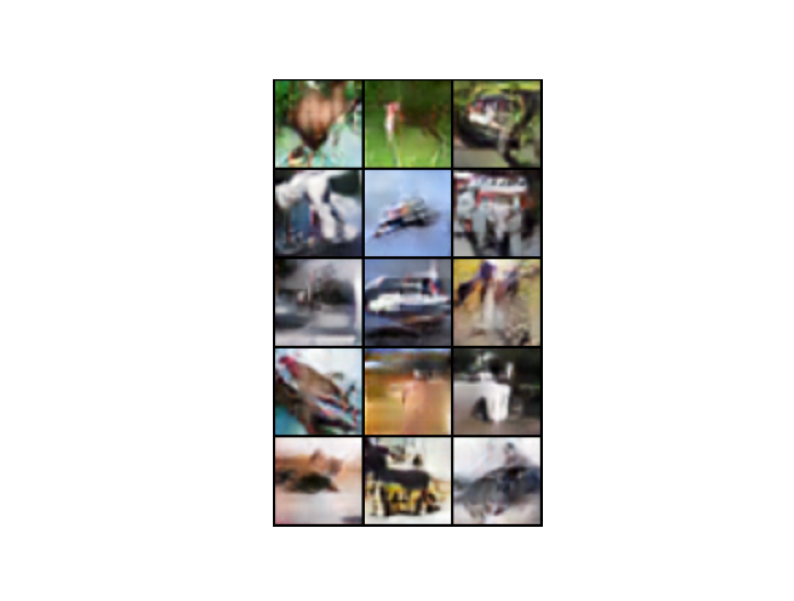

In [40]:
images = []
fig = plt.figure(figsize=(10, 10))  # Set the figure size to (width, height)

for epoch in range(NUM_EPOCHS):
    image = plt.imread(f'images/epoch_{epoch}.png')
    plt.axis('off')
    image_fig = plt.imshow(image)
    images.append([image_fig])

animate = animation.ArtistAnimation(fig, images, interval=500, blit=True, repeat_delay=1000)
animate.save('gan.gif')


---